## Import Packages

In [11]:
#importing some useful packages
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
%matplotlib inline

[[237 239 203 ...,  31  34  45]
 [239 192 154 ..., 101  71  28]
 [200 152 146 ..., 134 127  88]
 ..., 
 [134 124 104 ...,  85  85  99]
 [157 125 110 ...,  93  95  97]
 [182 128 120 ...,  83  81  59]]
(720, 1280)
(720, 1280, 3)


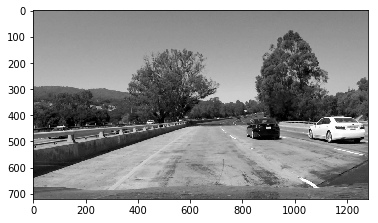

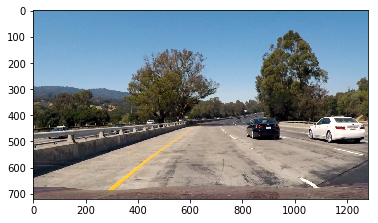

In [12]:
testLaneImg = mpimg.imread('test_images/test1.jpg')

gray = cv2.cvtColor(testLaneImg, cv2.COLOR_RGB2GRAY)
plt.figure()
plt.imshow(gray, cmap='gray')
print(gray)
print(gray.shape)
plt.figure()
print(testLaneImg.shape)
plt.imshow(testLaneImg)

## Read in an Image

True


error: /Users/jenkins/miniconda/1/x64/conda-bld/conda_1486587097465/work/opencv-3.1.0/modules/calib3d/src/calibration.cpp:3314: error: (-215) nimages > 0 in function calibrateCamera


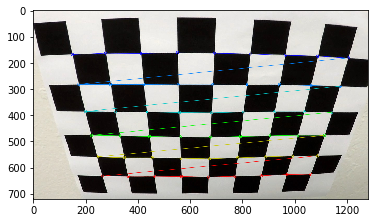

In [10]:
#reading in an image

num = 2
nx = 9
ny = 6


testImg = mpimg.imread('camera_cal/calibration' + str(num) + '.jpg')

gray = cv2.cvtColor(testImg, cv2.COLOR_RGB2GRAY)
# Find the chessboard corners
ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

# If found, draw corners
print (ret)

if ret == True:
    # Draw and display the corners
    cv2.drawChessboardCorners(testImg, (nx, ny), corners, ret)
    plt.figure()
    plt.imshow(testImg)
    


def cal_undistort(img, objpoints, imgpoints):
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    # Use cv2.calibrateCamera() and cv2.undistort()
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    return (mtx, dist, dst)


mtx, dist, undistorted = cal_undistort(testImg, objpoints, imgpoints)
plt.figure()
plt.imshow(undistorted)
    

In [13]:
nx = 9
ny = 6

objp = np.zeros((6*8,3), np.float32)
objp[:,:2] = np.mgrid[0:8, 0:6].T.reshape(-1,2)

imgpoints = []
objpoints = []

for i in range(1, 20) :
    testImg = mpimg.imread('camera_cal/calibration' + str(i) + '.jpg')
    gray = cv2.cvtColor(testImg, cv2.COLOR_RGB2GRAY)

    objp = np.zeros((nx*ny, 3), np.float32)
    objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)
    
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
    if ret : 
        objpoints.append(objp)
        imgpoints.append(corners)
    
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
print(ret)

1.1811071898965368


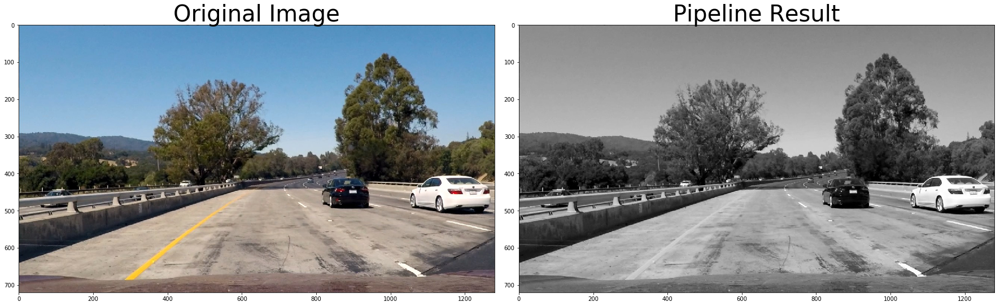

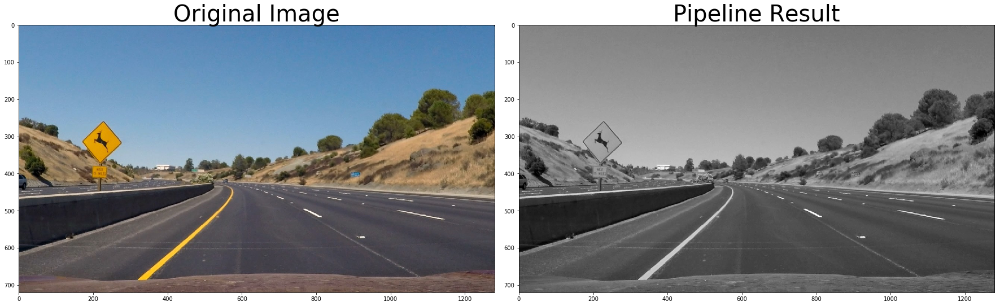

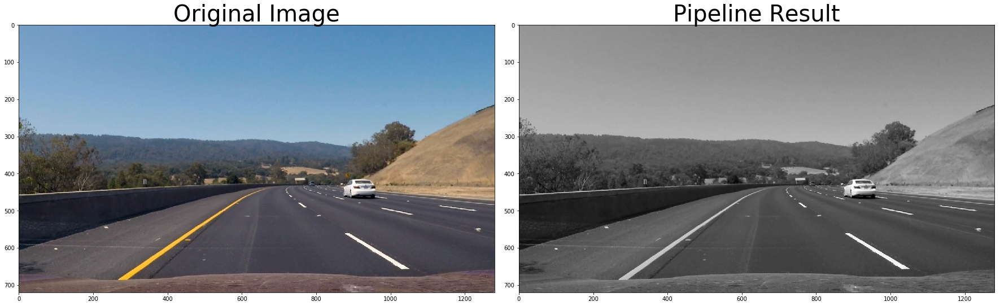

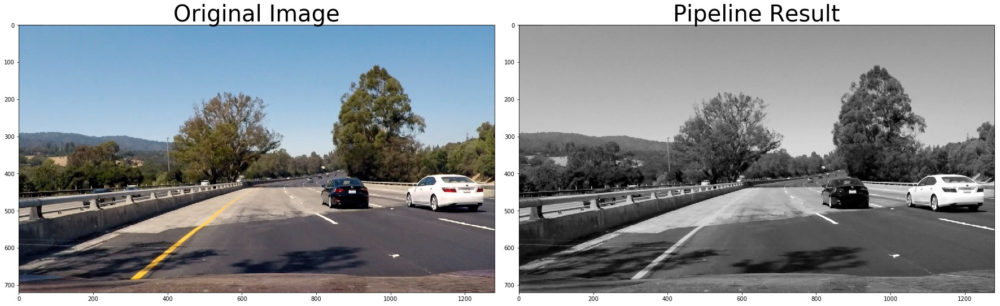

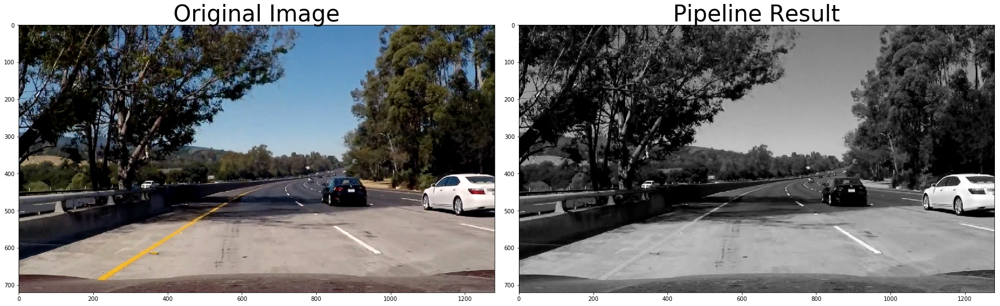

In [14]:

for i in range(1, 6) :
    testLaneImg = mpimg.imread('test_images/test' + str(i) + '.jpg')
    gray = cv2.cvtColor(testLaneImg, cv2.COLOR_RGB2GRAY)
    dst = cv2.undistort(gray, mtx, dist, None, mtx)

    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()

    ax1.imshow(testLaneImg)
    ax1.set_title('Original Image', fontsize=40)

    ax2.imshow(gray, cmap='gray')
    ax2.set_title('Pipeline Result', fontsize=40)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Ideas for Lane Detection Pipeline

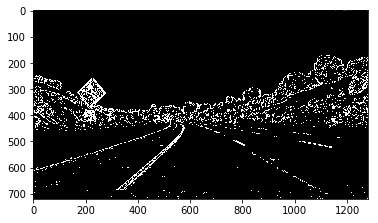

In [196]:


def gradient(img, threshX=(80, 100), sThresh=(120, 250)) :
    # Convert to HLS color space and separate the S channel
    # Note: img is the undistorted image
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]

    # Grayscale image
    # NOTE: we already saw that standard grayscaling lost color information for the lane lines
    # Explore gradients in other colors spaces / color channels to see what might work better
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # Sobel x
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))

    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= threshX[0]) & (scaled_sobel <= threshX[1])] = 1

    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= sThresh[0]) & (s_channel <= sThresh[1])] = 1

    # Stack each channel to view their individual contributions in green and blue respectively
    # This returns a stack of the two binary images, whose components you can see as different colors
    #color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary))

    # Combine the two binary thresholds
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1

    # Plotting thresholded images
    #f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    #ax1.set_title('Stacked thresholds')
    #ax1.imshow(img)

    #ax2.set_title('Combined S channel and gradient thresholds')
    #ax2.imshow(combined_binary, cmap='gray')
    return combined_binary

num=2
img = mpimg.imread('test_images/test' + str(num) + '.jpg')
plt.figure()
plt.imshow(gradient(img, threshX=(20, 160), sThresh=(180, 250)), cmap='gray')

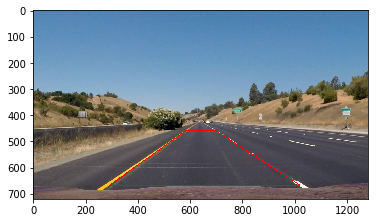

In [354]:
num=7
img = mpimg.imread('test_images/test' + str(num) + '.jpg')

color = (255, 0, 0)

#def drawBorder(img, fourPoints = [(595, 440), (690, 440), (1200, 668), (200, 668)]) :
def drawBorder(img, fourPoints = [(583, 460), (698, 460), (1020, 667), (292, 667)]) :
    cv2.line(img,fourPoints[0], fourPoints[1],color,2)
    cv2.line(img,fourPoints[1], fourPoints[2],color,2)
    cv2.line(img,fourPoints[2], fourPoints[3],color,2)
    cv2.line(img,fourPoints[0], fourPoints[3],color,2)

drawBorder(img)
plt.figure()
plt.imshow(img)

In [ ]:
num = 13
image = mpimg.imread('camera_cal/calibration' + str(num) + '.jpg')
#imgRed = image.copy()
print(image.shape, nx, ny)
w, h = image.shape[0], image.shape[1]
gray = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)[:,:,2]
dst_img = cv2.undistort(gray, mtx, dist, None, mtx)
print(dst_img.shape)
ret, corners = cv2.findChessboardCorners(dst_img, (nx, ny), None)
print(ret, dst_img.shape)
#print(corners.shape, corners.shape, corners[0], corners[w - 1], corners[-w], corners[-1])
fourPoints = [corners[0], corners[w - 1], corners[-w], corners[-1]]
#drawBorder(img = imgRed, fourPoints = fourPoints)


offsetX = 50
offsetY = 0
    
src = np.float32(fourPoints)
dst = np.float32([[offsetX, offsetY], [w - offsetX, offsetY], [offsetX, h - offsetY], [w - offsetX, h - offsetY]])
   
M = cv2.getPerspectiveTransform(src, dst)
warped = cv2.warpPerspective(gray,M,(h, w))
plt.figure()
plt.imshow(image, cmap = 'gray')
plt.figure()
plt.imshow(warped, cmap = 'gray')

In [411]:
def dir_threshold(img, sobel_kernel=3, threshS=(0,255), thresh=(0, np.pi/2)):
    # Grayscale
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    S = hls[:,:,2]
    
    binary = np.zeros_like(S)
    binary[(S > threshS[0]) & (S <= threshS[1])] = 1
    
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(binary, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(binary, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    #print(sobelx)
    #print(sobely)
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
 
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1
    #print(binary_output)
    # Return the binary image
    return binary_output

def corners_unwarp(img, nx, ny, mtx, dist, fourPoints = [(595, 440), (690, 440), (180, 668), (1180, 668)]):
    h, w = img.shape[0], dst_img.shape[1]
    
    offsetX = 300
    offsetTop = 0

    src = np.float32(fourPoints)
    dst = np.float32([[offsetX, offsetTop], [w - offsetX, offsetTop],[w - offsetX, h], [offsetX, h]])
   
    M = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(img,M,(w, h))
    
    return warped, M


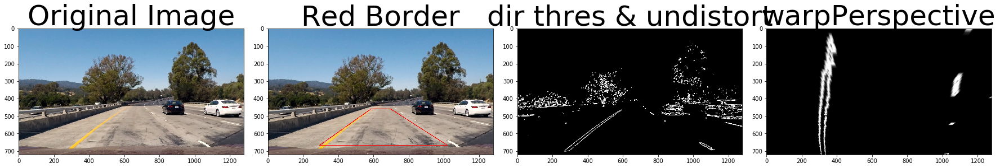

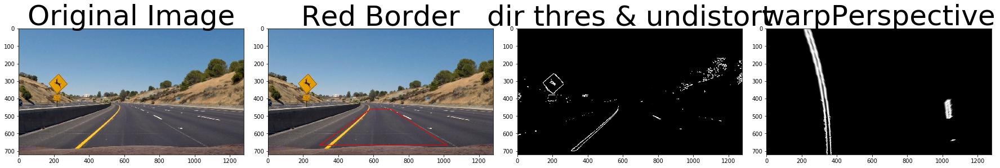

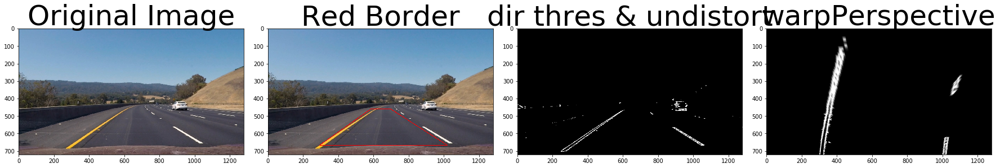

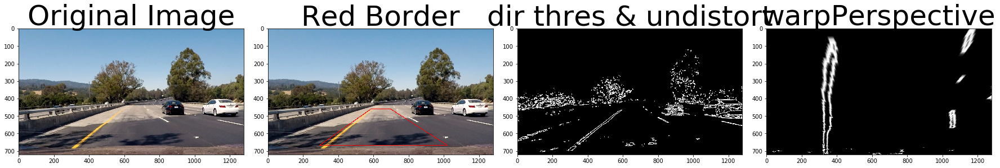

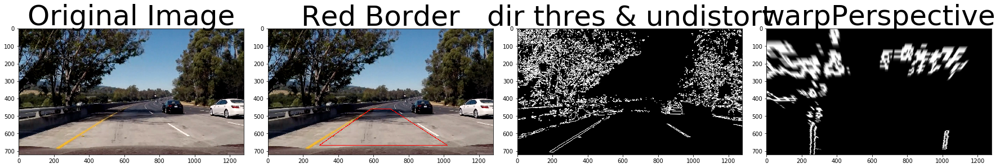

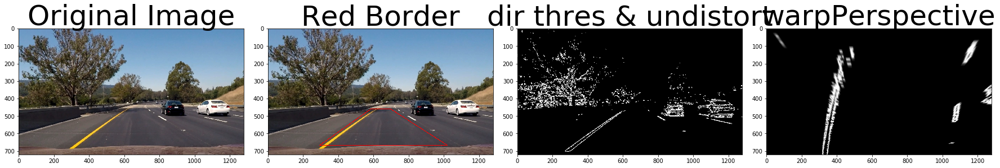

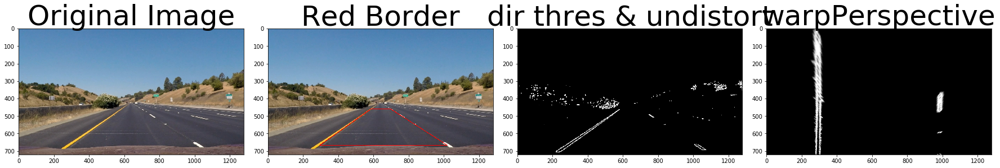

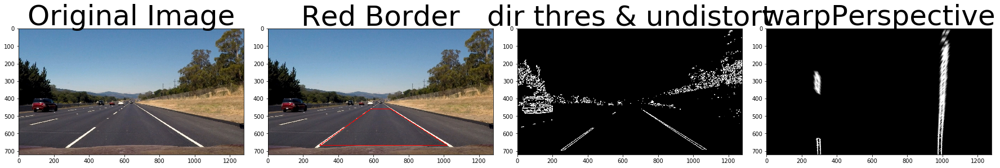

In [434]:


grayLines = []
    
for num in range(1, 9) :
    # Plot the result
    image = mpimg.imread('test_images/test' + str(num) + '.jpg') 
    imgRed = image.copy()
    fourPoints = [(583, 460), (698, 460), (1020, 667), (292, 667)]
    drawBorder(img = imgRed, fourPoints = fourPoints)
    
    sThresh=(150, 256)
    aTanThresh=(np.pi * 0.1, np.pi * 0.5)

    ksize = 3
    dir_binary = dir_threshold(image, sobel_kernel=ksize, threshS=sThresh, thresh=aTanThresh)
    dst_img = cv2.undistort(dir_binary, mtx, dist, None, mtx)
    
    top_down, perspective_M = corners_unwarp(dst_img, nx, ny, mtx, dist, fourPoints)
    #top_down, perspective_M = corners_unwarp(image, nx, ny, mtx, dist, fourPoints)
    grayLines.append(top_down)
    
    f, (ax0, ax1, ax2, ax3) = plt.subplots(1, 4, figsize=(24, 9))
    f.tight_layout()
    ax0.imshow(image)
    ax0.set_title('Original Image', fontsize=50)
    ax1.imshow(imgRed)
    ax1.set_title('Red Border', fontsize=50)
    ax2.imshow(dst_img, cmap='gray')
    ax2.set_title('dir thres & undistort', fontsize=50)
    ax3.imshow(top_down, cmap='gray')
    ax3.set_title('warpPerspective', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)



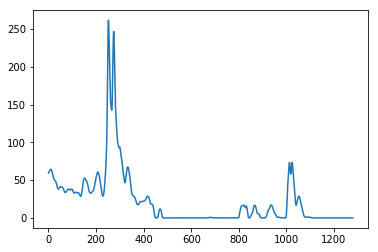

In [453]:
import numpy as np

for n in range(1, 2) :
    lineImg = grayLines[4]

    histogram = np.sum(lineImg[int(lineImg.shape[0]/3):,:], axis=0)
    plt.plot(histogram)

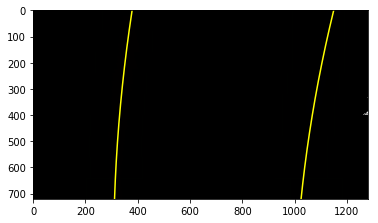

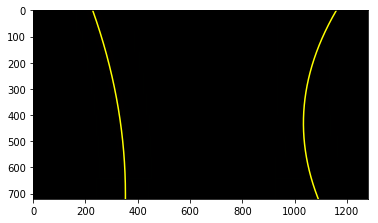

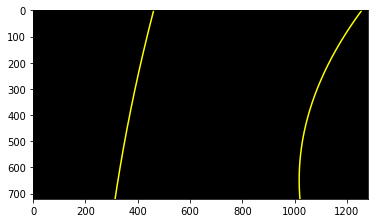

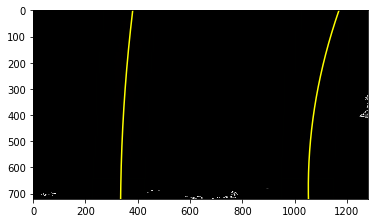

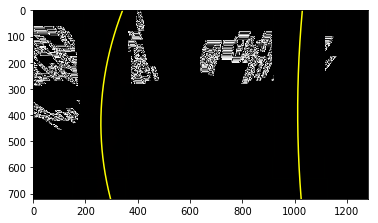

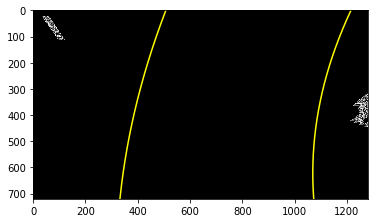

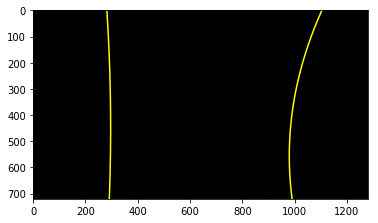

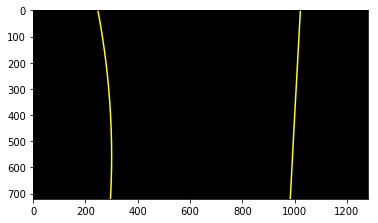

In [449]:
import numpy as np
import cv2
import matplotlib.pyplot as plt


def analyze(binary_warped) :
    middle = int(binary_warped.shape[0]/3)

    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[middle:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/3)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)


    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    plt.figure()
    plt.imshow(out_img)
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    plt.xlim(0, 1280)
    plt.ylim(720, 0)
    

for i in range(0, 8) :
    analyze(grayLines[i])

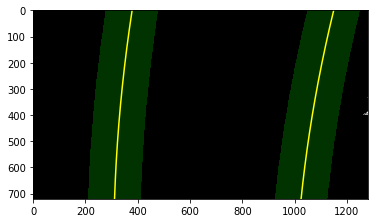

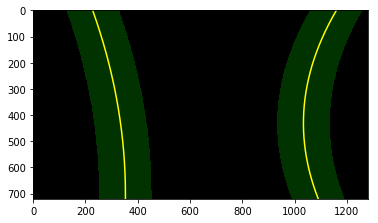

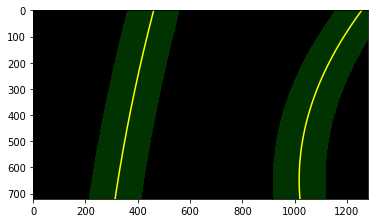

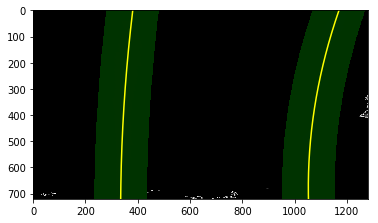

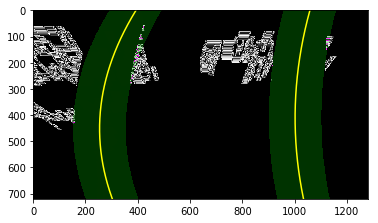

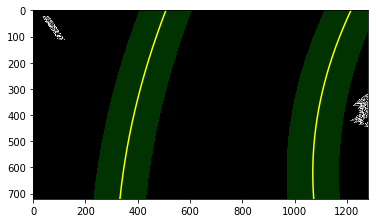

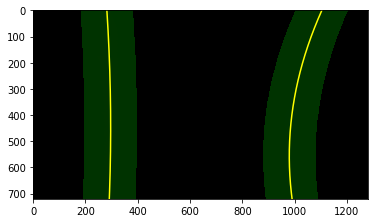

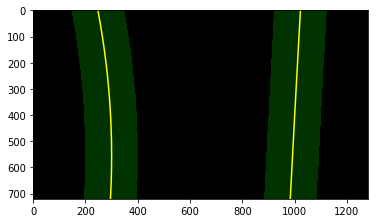

In [454]:
def analyze2(binary_warped) :
    middle = int(binary_warped.shape[0]/3)

    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[middle:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    plt.figure()
    plt.imshow(result)
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    plt.xlim(0, 1280)
    plt.ylim(720, 0)
    
for i in range(0, 8) :
    analyze2(grayLines[i])

1833.95795797 1493.40017253
602.0206758 m 490.174552661 m


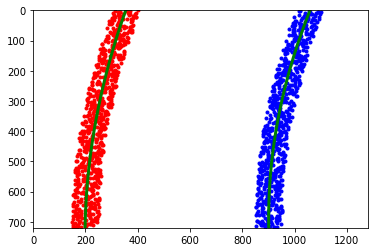

In [443]:
import numpy as np
import matplotlib.pyplot as plt
# Generate some fake data to represent lane-line pixels
ploty = np.linspace(0, 719, num=720)# to cover same y-range as image
quadratic_coeff = 3e-4 # arbitrary quadratic coefficient
# For each y position generate random x position within +/-50 pix
# of the line base position in each case (x=200 for left, and x=900 for right)
leftx = np.array([200 + (y**2)*quadratic_coeff + np.random.randint(-50, high=51) 
                              for y in ploty])
rightx = np.array([900 + (y**2)*quadratic_coeff + np.random.randint(-50, high=51) 
                                for y in ploty])

leftx = leftx[::-1]  # Reverse to match top-to-bottom in y
rightx = rightx[::-1]  # Reverse to match top-to-bottom in y


# Fit a second order polynomial to pixel positions in each fake lane line
left_fit = np.polyfit(ploty, leftx, 2)
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fit = np.polyfit(ploty, rightx, 2)
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

# Plot up the fake data
mark_size = 3
plt.plot(leftx, ploty, 'o', color='red', markersize=mark_size)
plt.plot(rightx, ploty, 'o', color='blue', markersize=mark_size)
plt.xlim(0, 1280)
plt.ylim(0, 720)
plt.plot(left_fitx, ploty, color='green', linewidth=3)
plt.plot(right_fitx, ploty, color='green', linewidth=3)
plt.gca().invert_yaxis() # to visualize as we do the images

y_eval = np.max(ploty)
left_curverad = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
print(left_curverad, right_curverad)

ym_per_pix = 30/720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meters per pixel in x dimension

# Fit new polynomials to x,y in world space
left_fit_cr = np.polyfit(ploty*ym_per_pix, leftx*xm_per_pix, 2)
right_fit_cr = np.polyfit(ploty*ym_per_pix, rightx*xm_per_pix, 2)
# Calculate the new radii of curvature
left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
# Now our radius of curvature is in meters
print(left_curverad, 'm', right_curverad, 'm')

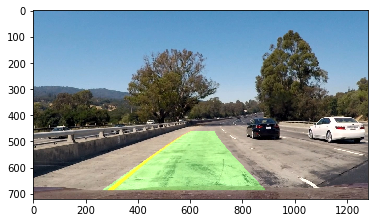

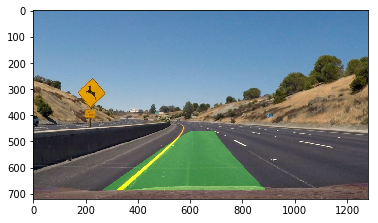

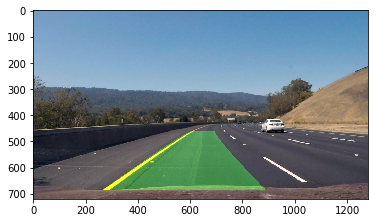

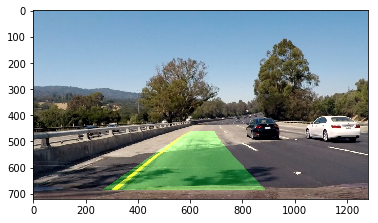

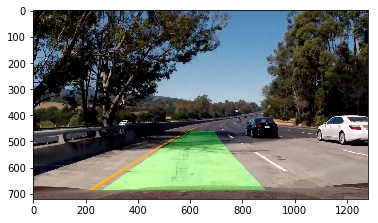

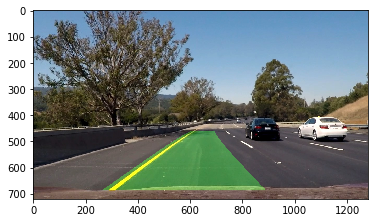

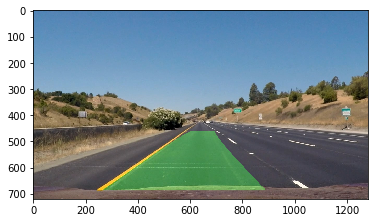

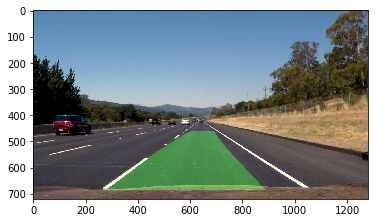

In [457]:
def drawLane(warped, undist, MinV) :
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
   
    newwarp = cv2.warpPerspective(color_warp, MinV, (image.shape[1], image.shape[0])) 
    # Combine the result with the original image
     
    result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
    plt.figure()
    plt.imshow(result)
    
MinV = cv2.getPerspectiveTransform(dst,src)
for i in range(0, 8) :
    undist = mpimg.imread('test_images/test' + str(i + 1) + '.jpg')
    drawLane(grayLines[i], undist, MinV)